<a href="https://colab.research.google.com/github/manuelladron/mmml_f20/blob/main/dcgan_ADARI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive 
#drive.flush_and_unmount()
drive.mount('/content/gdrive') 

Mounted at /content/gdrive


In [3]:
import sys
dataroot = '/content/gdrive/My Drive/PhD-CD/phd_cd_research/furniture'
sys.path.append('/content/gdrive/My Drive/PhD-CD/phd_cd_research/furniture')

In [4]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import json 
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import pdb

In [5]:
cuda = torch.cuda.is_available()
cuda

True

In [10]:
# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 100

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

tensor([[[ 0.9294,  0.9294,  0.9373,  ...,  0.9922,  0.9922,  0.9922],
         [ 0.9294,  0.9373,  0.9373,  ...,  0.9922,  0.9922,  0.9922],
         [ 0.9373,  0.9373,  0.9451,  ...,  0.9922,  0.9922,  0.9922],
         ...,
         [-0.0902, -0.0667, -0.0902,  ..., -0.1451, -0.1686, -0.2000],
         [-0.0196, -0.0118, -0.0118,  ..., -0.1529, -0.1451, -0.1608],
         [-0.0196, -0.0824, -0.0902,  ..., -0.1216, -0.1059, -0.1373]],

        [[ 0.9451,  0.9451,  0.9529,  ...,  1.0000,  1.0000,  1.0000],
         [ 0.9451,  0.9529,  0.9529,  ...,  1.0000,  1.0000,  1.0000],
         [ 0.9529,  0.9529,  0.9608,  ...,  1.0000,  1.0000,  1.0000],
         ...,
         [-0.0824, -0.0588, -0.0824,  ..., -0.1608, -0.1843, -0.2157],
         [-0.0118, -0.0039, -0.0039,  ..., -0.1686, -0.1608, -0.1765],
         [-0.0118, -0.0745, -0.0824,  ..., -0.1373, -0.1216, -0.1529]],

        [[ 0.9059,  0.9059,  0.9137,  ...,  0.9529,  0.9529,  0.9451],
         [ 0.9059,  0.9137,  0.9137,  ...,  0

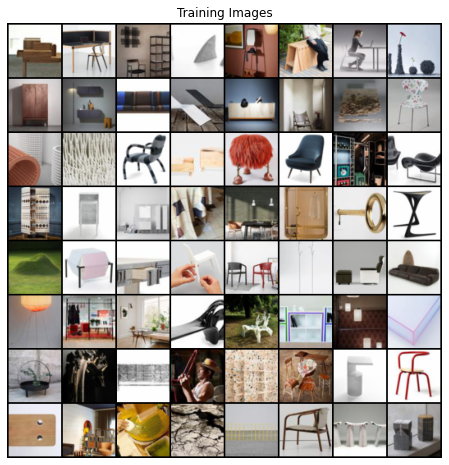

In [13]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
print(real_batch[0][0])
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [14]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [15]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [16]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [17]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [18]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [19]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

netG_path = '/content/gdrive/My Drive/PhD-CD/phd_cd_research/saved_models/generator_epoch_99_13299.pt'
netD_path = '/content/gdrive/My Drive/PhD-CD/phd_cd_research/saved_models/discriminator_epoch_99_13299.pt'

netG = torch.load(netG_path)
netD = torch.load(netD_path)

In [37]:
noise = torch.randn(150, nz, 1, 1, device=device)
fake = netG(noise)
print(fake.shape)
for i in range(150):
  fake_1 = fake[i,:,:,:]
  # plt.imshow(np.transpose(vutils.make_grid(fake.to(device), nrow=10, padding=2, normalize=True).detach().cpu().numpy(),(1,2,0)))
  path_save = '/content/gdrive/My Drive/PhD-CD/phd_cd_research/generated_images/ind_gen_samples/sample_{}.png'.format(i+900)
  vutils.save_image(fake_1.to(device), fp = path_save, nrow=1, padding=2, normalize=True)
# plt.imshow(transforms.ToPILImage()(fake))
# fake = fake.squeeze(0)
# fake = fake.permute(1,2,0)
# plt.imshow(fake.detach().cpu().numpy())

torch.Size([150, 3, 64, 64])


In [59]:
for i in range(1000):
  noise = torch.randn(1, nz, 1, 1, device=device)
  fake = netG(noise)
  path_save = '/content/gdrive/My Drive/PhD-CD/phd_cd_research/generated_images/individual_generated_samples/sample_{}.png'.format(i)
  vutils.save_image(fake.to(device), fp = path_save, nrow=1, padding=2, normalize=True)
  # vutils.save_image(fake.to(device)[:128], fp = path_save, nrow=16, padding=2, normalize=True)

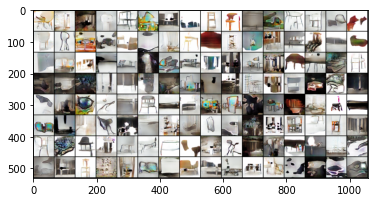

In [ ]:
plt.imshow(np.transpose(vutils.make_grid(fake.to(device)[:128], nrow=16, padding=2, normalize=True).detach().cpu().numpy(),(1,2,0)))

In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
save_model_path = '/content/gdrive/My Drive/PhD-CD/phd_cd_research/saved_models_retrain'
print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

            save_path_generator = save_model_path + '/generator_epoch_{}_{}.pt'.format(epoch, iters)
            save_path_discriminator = save_model_path + '/discriminator_epoch_{}_{}.pt'.format(epoch, iters)

            torch.save(netG, save_path_generator)
            torch.save(netD, save_path_discriminator)

        iters += 1

Starting Training Loop...
[0/100][0/133]	Loss_D: 0.0798	Loss_G: 4.2577	D(x): 0.9519	D(G(z)): 0.0281 / 0.0281
[0/100][50/133]	Loss_D: 0.0424	Loss_G: 4.3946	D(x): 0.9848	D(G(z)): 0.0261 / 0.0261
[0/100][100/133]	Loss_D: 0.0265	Loss_G: 4.8767	D(x): 0.9894	D(G(z)): 0.0155 / 0.0155
[1/100][0/133]	Loss_D: 0.0503	Loss_G: 4.6557	D(x): 0.9712	D(G(z)): 0.0200 / 0.0200
[1/100][50/133]	Loss_D: 0.0693	Loss_G: 3.9653	D(x): 0.9720	D(G(z)): 0.0380 / 0.0380
[1/100][100/133]	Loss_D: 0.0589	Loss_G: 4.9740	D(x): 0.9585	D(G(z)): 0.0154 / 0.0154
[2/100][0/133]	Loss_D: 0.0548	Loss_G: 5.1150	D(x): 0.9599	D(G(z)): 0.0131 / 0.0131
[2/100][50/133]	Loss_D: 0.0322	Loss_G: 4.7544	D(x): 0.9893	D(G(z)): 0.0207 / 0.0207
[2/100][100/133]	Loss_D: 0.0655	Loss_G: 4.2031	D(x): 0.9643	D(G(z)): 0.0278 / 0.0278
[3/100][0/133]	Loss_D: 0.0326	Loss_G: 4.7843	D(x): 0.9850	D(G(z)): 0.0169 / 0.0169
[3/100][50/133]	Loss_D: 0.0437	Loss_G: 4.6005	D(x): 0.9792	D(G(z)): 0.0218 / 0.0218
[3/100][100/133]	Loss_D: 0.0687	Loss_G: 4.2971	D(x)

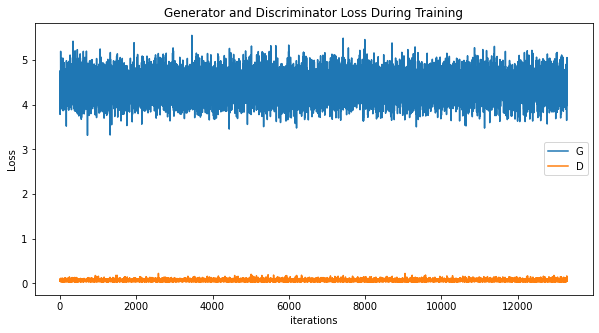

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

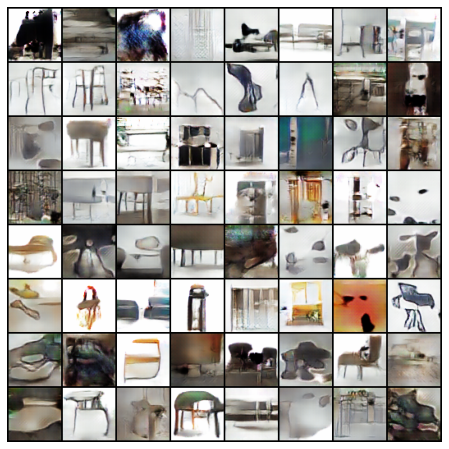

In [ ]:
# Saves a list of tensor matrices as png
def save_array(list_of_tensors):
    for i, im in enumerate(list_of_tensors):
        im = im.numpy() * 255
        im = im.astype(np.uint8)
        print(im.shape)
        ima = Image.fromarray(np.transpose(im,(1,2,0)))
        ima.save('/content/gdrive/My Drive/PhD-CD/phd_cd_research/generated_images/fake_{}.png'.format(i))


from IPython.display import HTML
import matplotlib
from PIL import Image
matplotlib.rcParams['animation.embed_limit'] = 2**128
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())
# ani.save('./adari_dcgan.gif', writer='imagemagick', fps=10)

In [ ]:
matplotlib.use('Agg')
mywriter = animation.FFMpegWriter(fps=10)
ani.save('/content/gdrive/My Drive/PhD-CD/phd_cd_research/generated_images/adari_dcgan.gif', writer='imagemagick', fps=10)

MovieWriter imagemagick unavailable; trying to use pillow instead.


TypeError: ignored

In [ ]:
save_array(img_list)

(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)
(3, 530, 530)


In [ ]:
import os
from os.path import join, dirname, exists

def savefig(fname, show_figure=True):
    if not exists(dirname(fname)):
        os.makedirs(dirname(fname))
    plt.tight_layout()
    plt.savefig(fname)
    if show_figure:
        plt.show()

def deprocess_batch(batch):
    '''
    Returns the batch to range [0,1]
    '''
    batch = (batch+1)/2
    return batch

def interpolate(G, quantity):

    with torch.no_grad():
        # Generate sample
        z = torch.randn(quantity, 100, 1, 1, device=device)
        # divide by 2 to have both ends
        z1, z2 = z.chunk(2, dim=0) # (num_samples / 2, latent dim)

        # np linspace (0,1,10) gives you [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
        interps = [deprocess_batch(G(z1 * (1 - alpha) + z2 * alpha)) for alpha in np.linspace(0, 1, 10)]
        interps = torch.stack(interps, dim=1).view(-1, 3, 64, 64).to(device)

    interps = interps.cpu().numpy()
    return interps

def show_samples_(samples, fname=None, nrow=10, title='Samples'):
    """
    Make a grid to show the samples. Rows with number of images = nrow
    """
    samples = torch.FloatTensor(samples)
    grid_img = vutils.make_grid(samples, nrow=nrow)
    print('grid img shape: ', grid_img.shape)
    plt.figure()
    plt.title(title)
    plt.imshow(grid_img.permute(1, 2, 0))
    plt.axis('off')
    if fname is not None:
        savefig(fname, True)
    else:
        plt.show()

from torchvision.transforms import ToPILImage
def save_interps_movie(list_of_tensors):
    for i, im in enumerate(list_of_tensors):
        ima = ToPILImage()(im.detach().cpu().squeeze(0))
        ima.save('/content/gdrive/My Drive/PhD-CD/phd_cd_research/generated_images/interps_movie/adari_interps_{}.png'.format(i))

def interpolate_movie(G):

    with torch.no_grad():
        # Generate sample
        z = torch.randn(20, 100, 1, 1, device=device)
        # divide by 2 to have both ends
        z1, z2 = z.chunk(2, dim=0) # (num_samples / 2, latent dim)

        # np linspace (0,1,10) gives you [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
        interps = [deprocess_batch(G(z1 * (1 - alpha) + z2 * alpha)) for alpha in np.linspace(0, 1, 20)]
        interps = torch.stack(interps, dim=1).view(-1, 3, 64, 64).to(device)
        save_interps_movie(interps)


In [ ]:
interpolate_movie(netG)

grid img shape:  torch.Size([3, 332, 662])
grid img shape:  torch.Size([3, 332, 662])
grid img shape:  torch.Size([3, 332, 662])
grid img shape:  torch.Size([3, 332, 662])
grid img shape:  torch.Size([3, 332, 662])
grid img shape:  torch.Size([3, 332, 662])
grid img shape:  torch.Size([3, 332, 662])
grid img shape:  torch.Size([3, 332, 662])
grid img shape:  torch.Size([3, 332, 662])
grid img shape:  torch.Size([3, 332, 662])


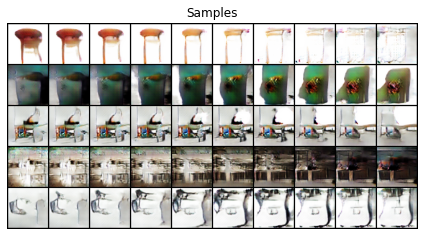

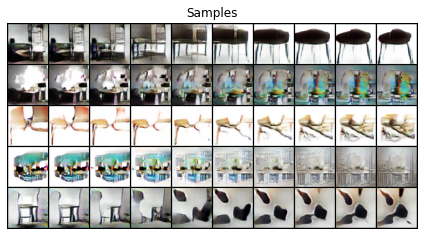

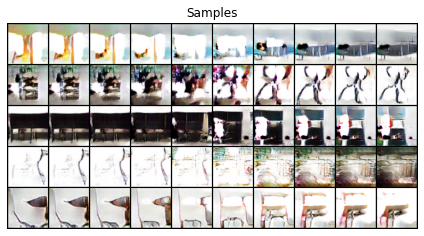

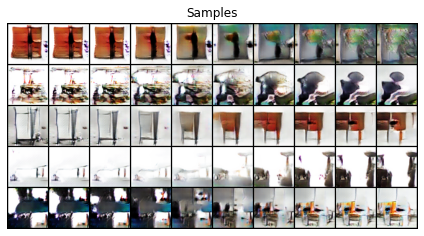

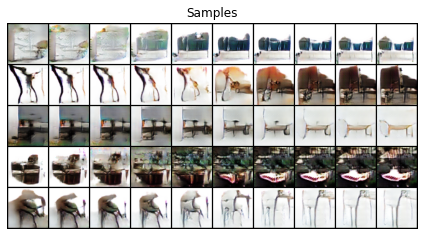

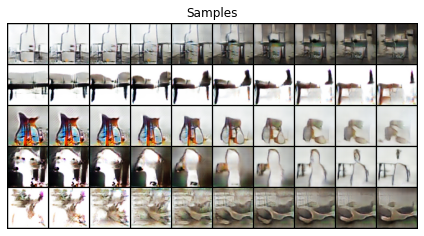

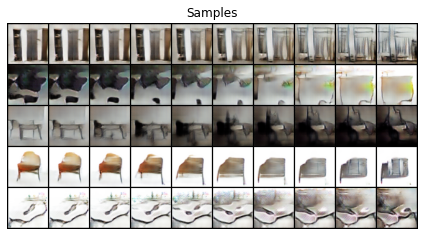

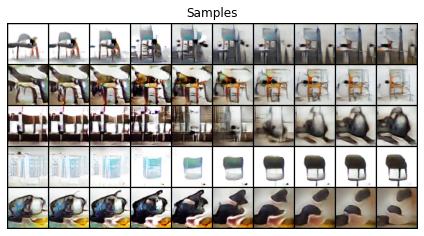

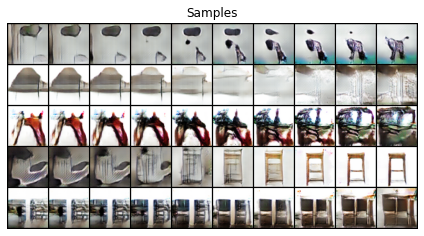

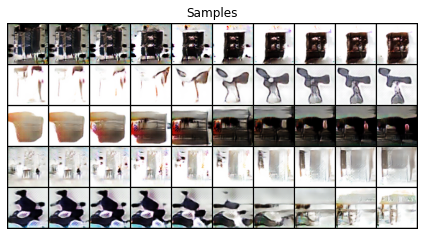

In [ ]:
for i in range(10): 
  interps = interpolate(netG, 10)
  show_samples_(interps, fname='/content/gdrive/My Drive/PhD-CD/phd_cd_research/generated_images/adari_interps_{}.png'.format(i+10))